In [1]:
#imports

import pandas as pd
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import umap.umap_ as umap
from sklearn_extra.cluster import KMedoids
import seaborn as sns
#from sklearn.cluster import AgglomerativeClustering, DBSCAN, KMeans, OPTICS
from sklearn.metrics import silhouette_samples, silhouette_score, pairwise_distances

In [2]:
# Save and load your data after clustering

def save_results():
    data.to_pickle(output_path+'data_clustered'+'.pkl')
    
def load_results():
    data = pd.read_pickle(output_path+'data_clustered'+'.pkl')

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [4]:
output_path = "./output/"
model_type = 'Transformer' #@param ['DAN','Transformer','Transformer_Multilingual']

In [5]:
data = pd.read_pickle(output_path+'data_preprocessed'+'.pkl')
labels_default = np.zeros(len(data.index))-1
data['label_manual'] = labels_default

In [6]:
embeddings = np.load(output_path+'/embeddings'+model_type+'.npy', mmap_mode=None, allow_pickle=False, fix_imports=True, encoding='ASCII')

In [7]:
# Set the number of dimensions to reduce to
num_dimensions =100

reducer_clustering = umap.UMAP(n_neighbors=50, 
                     n_components=num_dimensions, 
                     metric='cosine', 
                     #n_epochs=200, 
                     learning_rate=.5,
                     init='spectral', 
                     min_dist=0,
                     #spread=5.0, 
                     #set_op_mix_ratio=1.0, 
                     #local_connectivity=1.0, 
                     #negative_sample_rate=5, 
                     #transform_queue_size=4.0, 
                     force_approximation_algorithm=True, 
                     unique=True)
embeddings_umap = reducer_clustering.fit_transform(embeddings)

n_clusters: 2 silhouette_avg: 0.43116665
n_clusters: 102 silhouette_avg: 0.3647987
n_clusters: 202 silhouette_avg: 0.36606282
n_clusters: 302 silhouette_avg: 0.36688477
n_clusters: 402 silhouette_avg: 0.34753823
n_clusters: 502 silhouette_avg: 0.34898514
n_clusters: 602 silhouette_avg: 0.34345055
n_clusters: 702 silhouette_avg: 0.34584948
n_clusters: 802 silhouette_avg: 0.34288603
n_clusters: 902 silhouette_avg: 0.3404981


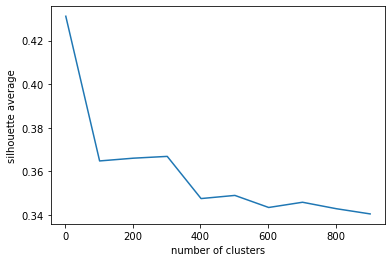

In [8]:
#optimize number of clusters
optimize_number_of_clusters = True#@param {type:'boolean'}

min_clusters=2 
max_clusters=1000 
step=100 

if optimize_number_of_clusters:
    rows_list = []
    inertias = []
    n_clusters = []
    silouette_scores = []
    init_param = 'k-medoids++' #@param ['random', 'heuristic', 'k-medoids++']
    random_state_param=1234 #@param {type:'number'}
    for i in range(min_clusters,max_clusters, step):
        temp_clustering = KMedoids(n_clusters=i, metric='euclidean', init=init_param, max_iter=200, random_state=random_state_param).fit(embeddings_umap)
        silhouette_avg = silhouette_score(embeddings_umap, temp_clustering.labels_)
        print("n_clusters:",i, "silhouette_avg:",silhouette_avg)
        silhouette_dict = {'number of clusters': i, 'silhouette average': silhouette_avg}
        rows_list.append(silhouette_dict)
    results = pd.DataFrame(rows_list)
    sns.lineplot(x = 'number of clusters', y = 'silhouette average',data = results)

In [53]:
number_of_clusters =  10
init_param = 'k-medoids++' #@param ['random', 'heuristic', 'k-medoids++']
clustering_model = KMedoids(n_clusters=number_of_clusters,
                            metric='cosine', 
                            init=init_param, 
                            max_iter=150, 
                            random_state=None).fit(embeddings_umap)
clustering_model
labels = clustering_model.labels_
data["label_kmedoids"] = labels
print("cluster","members", data["label_kmedoids"].value_counts().sort_values())

clustering_model.inertia_

medoids_indices = clustering_model.medoid_indices_

cluster members 2     198
8     878
9    1814
3    2050
5    3101
0    3432
4    3644
1    3768
7    3914
6    4525
Name: label_kmedoids, dtype: int64


In [54]:
#calculate distances
distances = np.diag(pairwise_distances(X = clustering_model.cluster_centers_[labels], Y = embeddings_umap[:], metric='cosine'))
data["distance_kmedoids"] = distances

In [55]:
num_dimensions =2

reducer_visualization = umap.UMAP(n_neighbors=50, 
                                  n_components=num_dimensions, 
                                  metric='cosine', 
                                  output_metric='euclidean', 
                                  #n_epochs=200, 
                                  learning_rate=.5,
                                  init='spectral', 
                                  min_dist=.1,
                                  spread=5.0, 
                                  set_op_mix_ratio=1.0, 
                                  local_connectivity=1.0, 
                                  negative_sample_rate=5, 
                                  transform_queue_size=4.0, 
                                  force_approximation_algorithm=True, 
                                  unique=True)
embeddings_umap_2d = reducer_visualization.fit_transform(embeddings)

/Users/yaozheng/opt/anaconda3/lib/python3.8/site-packages/umap/umap_.py:1330: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


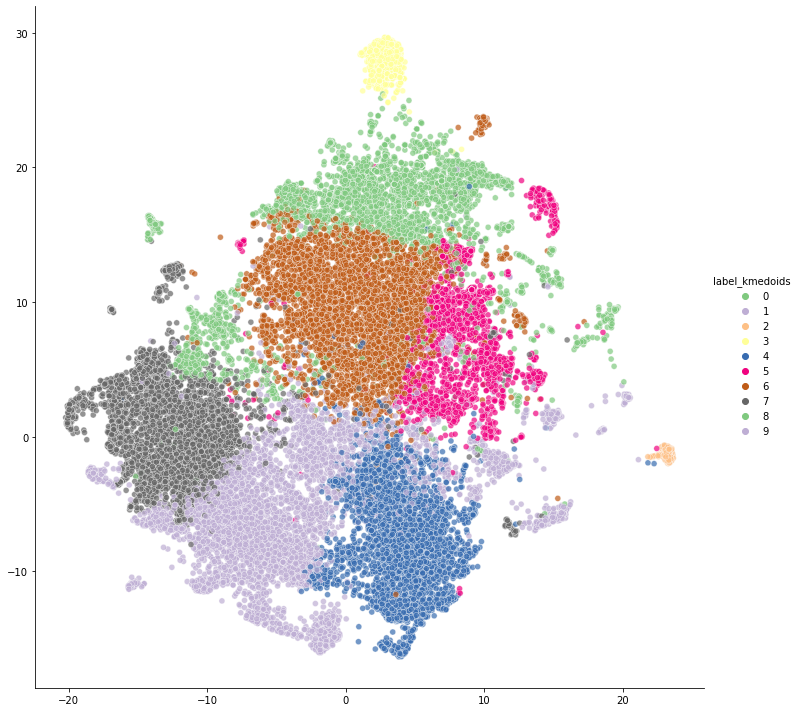

In [56]:
#@markdown Set the color palette used for visualizing different clusters
palette_param = "Accent" #@param ['Accent','cubehelix', "tab10", 'Paired', "Spectral"]
#@markdown Set opacity of data points (1 = opaque, 0 = invisible)
alpha_param = 0.7 #@param {type:"slider", min:0, max:1, step:0.01}


sns.relplot(x = embeddings_umap_2d[:, 0], y = embeddings_umap_2d[:, 1],  hue = data['label_kmedoids'], palette = palette_param,alpha = alpha_param,height = 10)

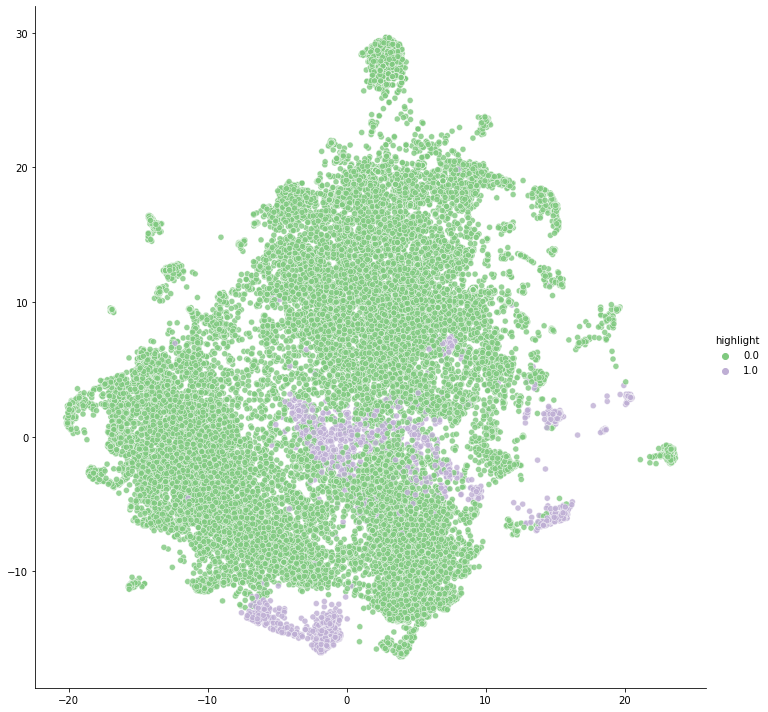

In [89]:
## Choose a cluster to higlight:
cluster_num = 9

data['highlight'] = np.zeros(len(data.index))
data.loc[data['label_kmedoids'] == cluster_num, 'highlight'] = 1

sns.relplot(x = embeddings_umap_2d[:, 0], y = embeddings_umap_2d[:, 1],  hue = data['highlight'], palette = "Accent",alpha = 0.8,height = 10)

In [46]:
# print the medoids 
data.iloc[medoids_indices]

,publishedAt,authorName,text,isReply,cleaned,label_manual,label_kmedoids,distance_kmedoids,highlight
5912,2020-04-30 15:31:37,Jack Kellenberg,The real evil one is those adults who told her to do so:),0,The real evil one is those adults who told her to do so:)\n\n,-1,0,0.000000e+00,0.0
24152,2019-09-24 02:30:45,terry vietz,Savant.,0,Savant.\n\n,-1,1,2.980232e-07,1.0
18010,2019-09-26 09:23:19,Grant Mathieson,Yes let us all listen to the hysterical child.,0,Yes let us all listen to the hysterical child.\n\n,-1,2,0.000000e+00,0.0
25310,2019-09-23 21:33:12,Horacio Caine,Mich auch ich dachte ich schau nen schlechten Horrorfilm. Übel da bekommt man Albträume wenn man die beobachtet,1,Mich auch ich dachte ich schau nen schlechten Horrorfilm. Übel da bekommt man\nAlbträume wenn man die beobachtet\n\n,-1,3,0.000000e+00,0.0
7100,2020-04-12 08:51:45,kiss peter,"@Murray Franklin man , :::))))))))))))))))",1,"@ man , :::))))))))))))))))\n\n",-1,4,1.192093e-07,0.0


In [47]:
# print statistics for each cluster
data['label_kmedoids'].value_counts().sort_values()
for k,g in data.groupby(by = 'label_kmedoids'):
      print(g.iloc[0]['label_kmedoids'],"number of samples: ",len(g.index),"mean distance from center: ", 100*np.mean(g['distance_kmedoids']), "Proportion of replies:", 100*np.sum(g['isReply'])/len(g.index))

0 number of samples:  13556 mean distance from center:  0.05260546458885074 Proportion of replies: 39.52493360873414
1 number of samples:  2050 mean distance from center:  0.000720625985195511 Proportion of replies: 51.75609756097561
2 number of samples:  7852 mean distance from center:  0.029555949731729925 Proportion of replies: 43.69587366276108
3 number of samples:  198 mean distance from center:  0.00013576614037447143 Proportion of replies: 23.232323232323232
4 number of samples:  3668 mean distance from center:  0.01902402436826378 Proportion of replies: 52.535441657579064


In [90]:
# Choose a cluster to print
cluster_number =   1
# Choose the number of samples to print
number_of_samples_to_print = 10000

data['label_kmedoids'] = data['label_kmedoids'].astype('category')
cluster = data[data['label_kmedoids']==cluster_number]
if cluster["text"].count()<=number_of_samples_to_print:
  number_of_samples_to_print = cluster["text"].count()

cluster = cluster.sort_values(by='distance_kmedoids')

print("Number of samples in the cluster:", cluster["text"].count())
print("Average Distance from cluster center:", np.mean(cluster['distance_kmedoids']))
cluster

Number of samples in the cluster: 3768
Average Distance from cluster center: 0.00018508934590499848


,publishedAt,authorName,text,isReply,cleaned,label_manual,label_kmedoids,distance_kmedoids,highlight
3559,2020-09-11 10:23:52,SmartTech,"I can&#39;t tell my parents these words, she said it to all the world leaders in one go. Man, she doesn&#39;t mince her words. 😮",0,"I can't tell my parents these words, she said it to all the world leaders in\none go. Man, she doesn't mince her words. 😮\n\n",-1,1,0.000000,0.0
10904,2019-12-09 14:51:56,Samuel Luttrell-Henshaw,Because world leaders are ignorant to the fact that climate change is an issue and would rather make fun of her than take what she's saying on board,1,Because world leaders are ignorant to the fact that is an issue\nand would rather make fun of her than take what she's saying on board\n\n,-1,1,0.000009,0.0
1565,2020-11-18 22:22:52,tinecaa tinecaa,"A white girl screaming at world leaders thanks to her educational system, which were built by the blood of innocent peoples around the world.",0,"A white girl screaming at world leaders thanks to her educational system,\nwhich were built by the blood of innocent peoples around the world.\n\n",-1,1,0.000009,0.0
14660,2019-10-10 09:52:06,Martin Ulrichsen,"The public has made fun of the people brave enough to stand up to the established for a long time. Greta spoke before the world leaders at UN at 16 years of age that week. What did we accomplish that week?<br /><br /><br />Me personally think her speech is in line with Martin Luther King`s famous speech about having dreams, which also were ridiculed at the time given. And nobody believed what he said could become reality. She will be remembered as part of a change in thinking. She speaks for the future generation. That`s a brave little woman right there.",0,"The public has made fun of the people brave enough to stand up to the\nestablished for a long time. spoke before the world leaders at UN at 16\nyears of age that week. What did we accomplish that week? \n \n \nMe personally think her speech is in line with Luther King`s famous\nspeech about having dreams, which also were ridiculed at the time given. And\nnobody believed what he said could become reality. She will be remembered as\npart of a change in thinking. She speaks for the future generation. That`s a\nbrave little woman right there.\n\n",-1,1,0.000010,0.0
445,2021-01-05 04:05:00,RMDNA Rt,This lass should not be allowed to speak and blame world leaders. She should not think that SHE is the only one with a dream to create a better world. She should not speak over dramatically and make herself embarrassed.,0,This lass should not be allowed to speak and blame world leaders. She should\nnot think that SHE is the only one with a dream to create a better world. She\nshould not speak over dramatically and make herself embarrassed.\n\n,-1,1,0.000010,0.0
22670,2019-09-24 19:36:15,Mindset Power,"If you guys want to know the real purpose behind her ""speech"" it is to create a ""young people"" vs ""old people"" social war to feed the Leftist Corporate Machine and keep us divided. Notice how many times she says young and she herself is an embodiment of this frame. It's social engineering, specifically to own the ""young"" voting bloc and indoctrinate the constant influx of young minds. The Left has been doing this same psychological-social tactic by creating the perception of the following oppressor-vs-victim wars: ""white people"" vs ""people of color, "" men vs women, and straight vs ""LGBT."" This Leftist tactic is cultural cancer and these scumbags are pure evil.",1,"If you guys want to know the real purpose behind her ""speech"" it is to create\na ""young people"" vs ""old people"" social war to feed the Leftist Corporate\nMachine and keep us did. Notice how many times she says young and she\nherself is an embodiment of this frame. It's social engineering, specifically\nto own the ""young"" voting bloc and indoctrinate the constant influx of young\nminds. The Left has been doing this same psychological-social tactic by\ncreati

In [17]:
#which cluster would you like to assign labels to?
cluster_number = 6
#your label
label_manual = 'music'
#the minimum distance from the cluster medoid be for a data point to still get the specified label
min_distance = 0
#the maximum distance from the cluster medoid be for a data point to still get the specified label
max_distance = 1000

# 2. Filter data by cluster label and specified label to filtered data
data.loc[(data['label_kmedoids']==cluster_number) & (data['distance_kmedoids'] <= max_distance) & (data['distance_kmedoids'] >= min_distance),  'label_manual'] = label_manual

In [18]:
data[data['label_kmedoids']==cluster_number].sort_values(by='distance_kmedoids')

,publishedAt,authorName,text,isReply,cleaned,label_manual,label_kmedoids,distance_kmedoids,highlight
26487,2019-09-23 17:03:38,Sir Cliff,It would help if they had some evidence tbh,1,It would help if they had some ence tbh\n\n,music,6,2.384186e-07,0.0
18976,2019-09-25 20:58:23,Ace K,"Lmao, they were exposed rather than ruined.",1,"Lmao, they were exposed rather than ruined.\n\n",music,6,4.529953e-06,0.0
25004,2019-09-24 04:58:08,Matsotello Molefe,I feel like they weren't even really listening,1,I feel like they weren't even really listening\n\n,music,6,4.887581e-06,0.0
16880,2019-09-27 20:09:57,The Purifier,Plot twist: They get away with it.,0,Plot twist: They get away with it.\n\n,music,6,6.020069e-06,0.0
16198,2019-09-29 09:11:19,Jim Canterak,FASDs at their finest.,0,FASDs at their finest.\n\n,music,6,6.675720e-06,0.0
4598,2020-07-12 08:19:34,maj,I think they`re just using this poor girl,0,I think they`re just using this poor girl\n\n,music,6,6.735325e-06,0.0
3880,2020-10-16 19:37:28,Walterthecat,While they are doing a better job then,1,While they are doing a better job then\n\n,music,6,6.794930e-06,0.0
25614,2019-09-23 23:15:10,martin tsanov,@thebigsleeparticdog at least they are going to burn rich!,1,@ at least they are going to burn rich!\n\n,music,6,6.854534e-06,0.0
12230,2019-11-18 07:33:03,rivallin,No wonder. They're much better actors.,1,No wonder. They're much better actors.\n\n,music,6,7.867813e-06,0.0
3897,2020-09-02 16:25:10,A1 Marine,They don't even get actual clothes,1,They don't even get actual clothes\n\n,music,6,8.463860e-06,0.0
